# Angle Shift Phantom

In [1]:
import gc
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tomopy

from skimage.transform import radon, iradon, rotate, iradon_sart
from scipy.interpolate import interp2d
from skimage.transform import resize
from scipy.ndimage import zoom
from tqdm import tqdm

from PIL import Image
from PIL import ImageDraw

from tomopy.sim.project import project

import sys
sys.path.append('../')
from theta_correction import theta_correction

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def get_rect(x, y, width, height, angle):
    rect = np.array([(0, 0), (width, 0), (width, height), (0, height), (0, 0)])
    theta = (np.pi / 180.0) * angle
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta), np.cos(theta)]])
    offset = np.array([x, y])
    transformed_rect = np.dot(rect, R) + offset
    return transformed_rect

def add_lines(phantom, N):
    size = phantom.shape[0]
    Xs, ys = np.random.uniform(size, size=N), np.random.uniform(size, size=N)
    widths = np.random.uniform(1, 5, size=N)
    heights = widths * np.random.uniform(10, 40, size=N)
    angles = np.random.uniform(0, 360, size=N)

    img = Image.fromarray(phantom)
    draw = ImageDraw.Draw(img)
    for X, y, height, width, angle in zip(Xs, ys, heights, widths, angles):
        rect = get_rect(X, y, width, height, angle)
        draw.polygon([tuple(p) for p in rect], fill=1)

    return np.array(img)

def add_circles(phantom, N, radius_range=(1, 10)):
    size = phantom.shape[0]
    Xs, ys = np.random.uniform(size, size=N), np.random.uniform(size, size=N)
    radii = np.random.uniform(radius_range[0], radius_range[1], size=N)

    img = Image.fromarray(phantom)
    draw = ImageDraw.Draw(img)
    for X, y, radius in zip(Xs, ys, radii):
        draw.ellipse([X - radius, y - radius, X + radius, y + radius], fill=1)

    return np.array(img)

def add_triangles(phantom, N):
    size = phantom.shape[0]
    p0Xs = np.random.uniform(size, size=N)
    p0ys = np.random.uniform(size, size=N)

    angle1s = np.random.uniform(0, 360, size=N)
    side1 = np.random.uniform(5, 20, size=N)
    p1Xs = p0Xs + side1 * np.cos(angle1s)
    p1ys = p0ys + side1 * np.sin(angle1s)
    
    angles2s = np.random.uniform(0, 360, size=N)
    side2 = np.random.uniform(5, 20, size=N)
    p2Xs = p0Xs + side2 * np.cos(angles2s + 120)
    p2ys = p0ys + side2 * np.sin(angles2s + 120)

    img = Image.fromarray(phantom)
    draw = ImageDraw.Draw(img)
    for p0X, p0y, p1X, p1y, p2X, p2y in zip(p0Xs, p0ys, p1Xs, p1ys, p2Xs, p2ys):
        draw.polygon([p0X, p0y, p1X, p1y, p2X, p2y], fill=1)

    return np.array(img)


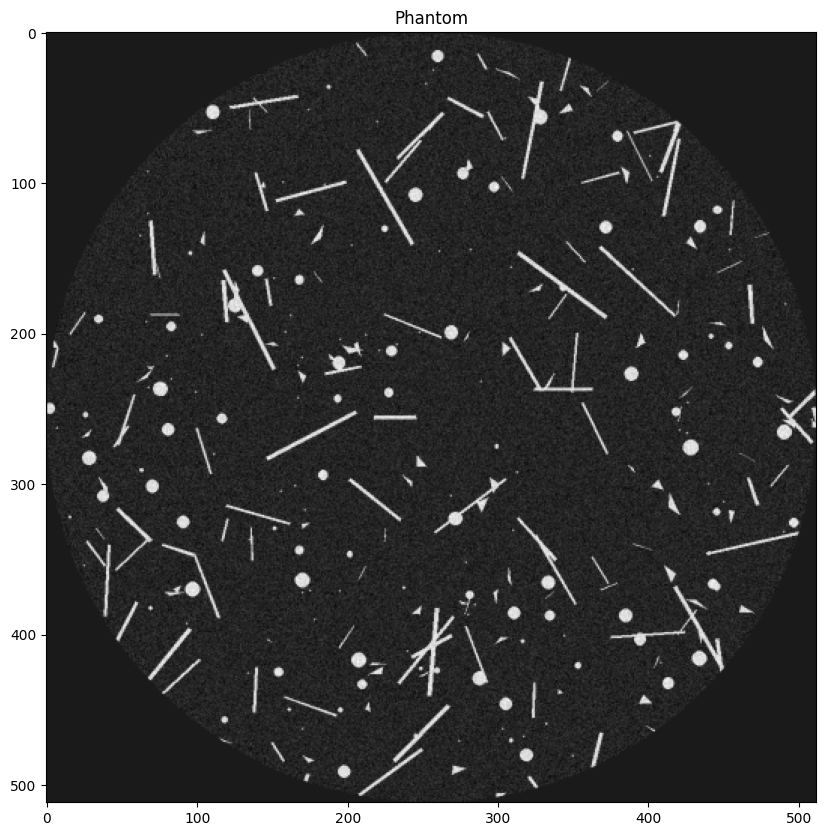

In [3]:
def generate_phantom(size, background):
    upsample_size = size * 2
    phantom = np.ones((upsample_size, upsample_size), dtype=float) * background

    phantom = add_lines(phantom, 100)
    phantom = add_circles(phantom, 100)
    phantom = add_triangles(phantom, 100)
    phantom = add_circles(phantom, 100, (1, 1)) # add points

    # add noise
    phantom = phantom + np.random.normal(0, 0.1, size=(upsample_size, upsample_size))

    # circle mask
    phantom = phantom * (np.sqrt((np.arange(upsample_size) - upsample_size / 2) ** 2 + (np.arange(upsample_size)[:, np.newaxis] - upsample_size / 2) ** 2) < upsample_size / 2)
    phantom = resize(phantom, (size, size), mode='constant', anti_aliasing=True, preserve_range=True)
    return phantom

# fix the seed for reproducibility
np.random.seed(42)
phantom = generate_phantom(512, 0.05)

plt.figure(figsize=(10, 10))
plt.title('Phantom')
plt.imshow(phantom, cmap='gray')

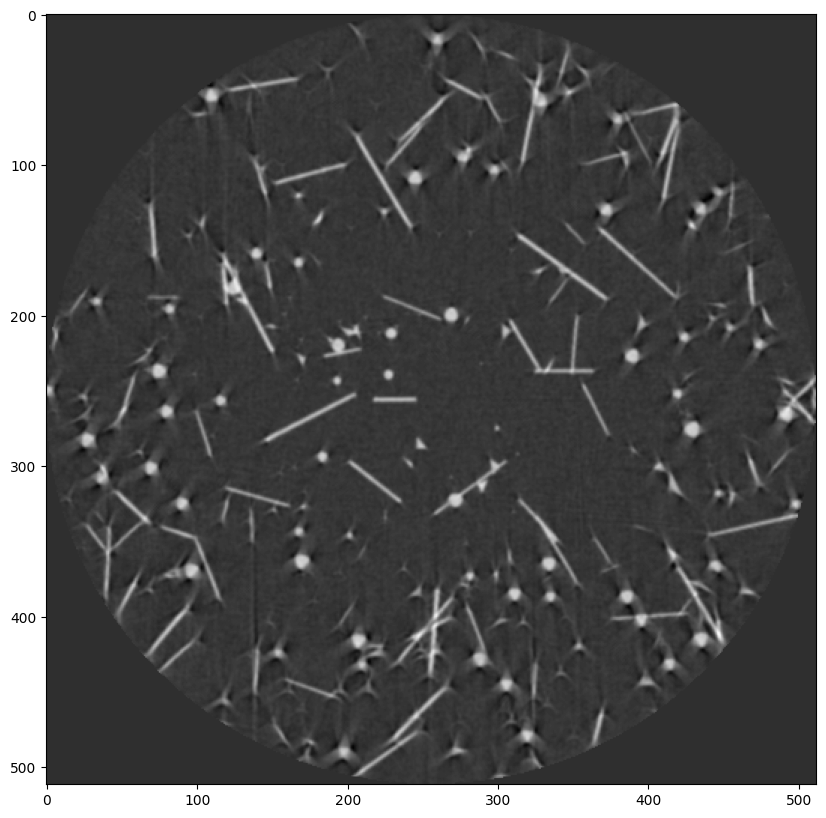

In [9]:
r = tomopy.recon(sinogram[:, np.newaxis, :],
                    corrected_angle,
                    center=512 / 2 - 0.3,
                    algorithm=tomopy.astra,
                    sinogram_order=False,
                    options={'proj_type': 'cuda', 'method': 'FBP_CUDA', 'extra_options': {'FilterType': 'hamming'}},
                    ncore=1)
r = tomopy.circ_mask(r, axis=0, ratio=1.0, val=0)[0]

plt.figure(figsize=(10, 10))
plt.imshow(r, cmap='gray')

In [4]:
def experiment(phantom, true_angle, assumed_angle):
    def recon(sinogram, angle):
        r = tomopy.recon(sinogram,
                            angle,
                            center=None,
                            algorithm=tomopy.astra,
                            sinogram_order=False,
                            options={'proj_type': 'cuda', 'method': 'FBP_CUDA', 'extra_options': {'FilterType': 'hamming'}},
                            ncore=1)
        return tomopy.circ_mask(r, axis=0, ratio=1.0, val=0)[0]
        
    sinogram = project(phantom[np.newaxis, ...], theta=true_angle, pad=False)

    true_recon = recon(sinogram, true_angle)
    assumed_recon = recon(sinogram, assumed_angle)

    corrected_angle = theta_correction(sinogram[:, 0, :], assumed_angle, None, 8, [-0.05, 0.05], 50, 500)
    corrected_recon = recon(sinogram, corrected_angle)

    return true_recon, assumed_recon, corrected_recon, corrected_angle

def plot_results(phantom, true_recon, assumed_recon, corrected_recon, true_shift, corrected_shift, prefix='./notebooks/figs/'):
    # save each image
    plt.imsave(prefix + 'phantom.png', phantom, cmap='gray')
    plt.imsave(prefix + 'true_recon.png', true_recon, cmap='gray')
    plt.imsave(prefix + 'assumed_recon.png', assumed_recon, cmap='gray')
    plt.imsave(prefix + 'corrected_recon.png', corrected_recon, cmap='gray')

    # plot 4 subplots (phantom, true recon, assumed recon, corrected recon)
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    plt.title('Phantom')
    plt.imshow(phantom, cmap='gray')
    plt.subplot(2, 2, 2)
    plt.title('True Recon')
    plt.imshow(true_recon, cmap='gray')
    plt.subplot(2, 2, 3)
    plt.title('Assumed Recon')
    plt.imshow(assumed_recon, cmap='gray')
    plt.subplot(2, 2, 4)
    plt.title('Corrected Recon')
    plt.imshow(corrected_recon, cmap='gray')
    plt.tight_layout()

    # plot true shift and corrected shift together
    plt.figure(figsize=(10, 5))
    plt.title('Angle Shift')
    plt.plot(true_shift - true_shift.mean(), label='true angle shift')
    plt.plot(corrected_shift - corrected_shift.mean(), label='corrected angle shift')
    plt.legend()

## Linear Angle Shift

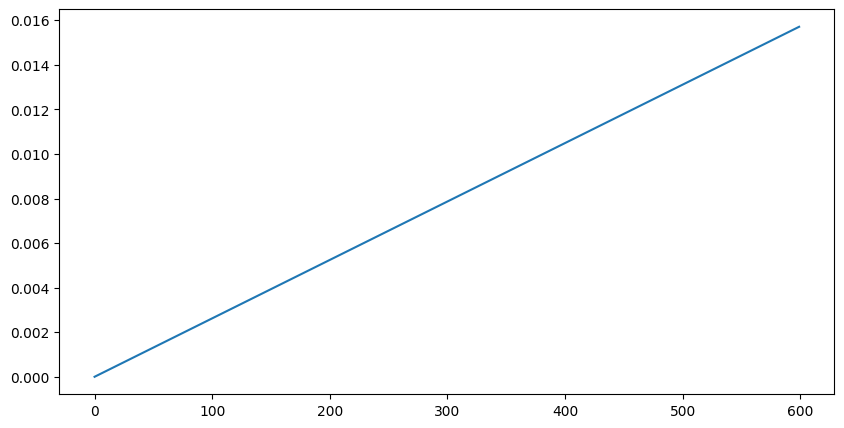

|   iter    |  target   |  input0   |  input1   |  input2   |  input3   |  input4   |  input5   |  input6   |  input7   |
-------------------------------------------------------------------------------------------------------------------------
| 73        | -0.2446   | -0.009798 | 0.001318  | -0.003949 | -0.006959 | -0.000686 | -0.002209 | -0.000727 | 0.007726  |
| 142       | -0.2415   | -0.05     | -0.05     | -0.05     | -0.05     | -0.05     | -0.05     | -0.05     | -0.03474  |
| 152       | -0.2383   | -0.01079  | -0.003668 | 0.0001358 | 0.0009695 | 0.005824  | 0.002091  | 0.007248  | 0.008964  |
| 228       | -0.2342   | -0.007823 | -0.002287 | 0.001619  | 0.002546  | 0.002889  | 0.002484  | 0.00416   | 0.009135  |
| 355       | -0.2339   | -0.007502 | -0.001404 | 0.0003612 | 0.003102  | 0.003077  | 0.003096  | 0.004855  | 0.008844  |
| 447       | -0.2322   | -0.02518  | -0.02186  | -0.02001  | -0.01841  | -0.01607  | -0.01523  | -0.01308  | -0.01263  |
| 503       | -0.232    

In [5]:
assumed_angle = np.linspace(0, np.pi, 600)
angle_shift = assumed_angle * 0.005
true_angle = angle_shift + assumed_angle

plt.figure(figsize=(10, 5))
plt.plot(angle_shift)
plt.show()

true_recon, assumed_recon, corrected_recon, corrected_angle = experiment(phantom, true_angle, assumed_angle)

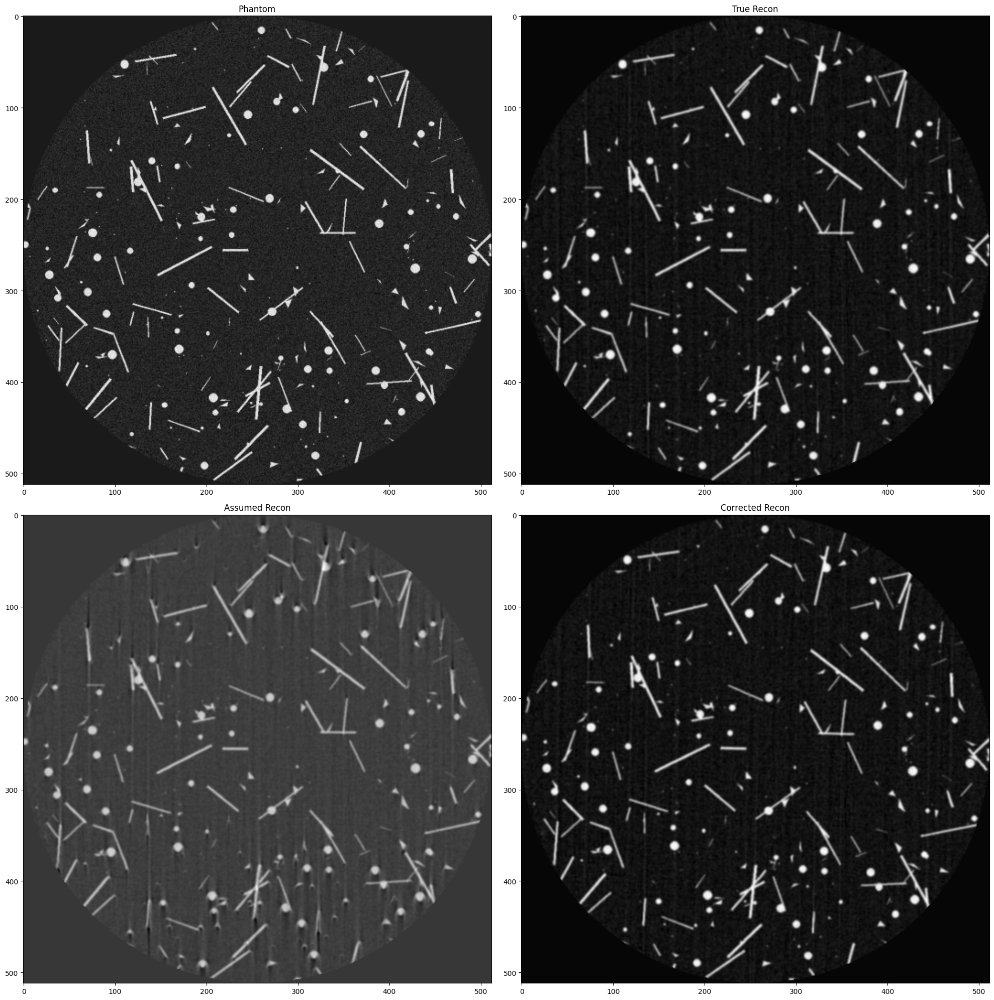

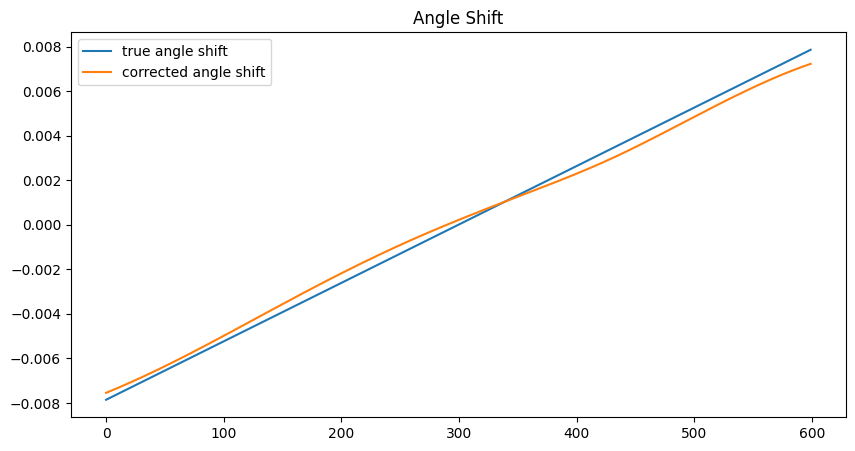

In [6]:
plot_results(phantom, true_recon, assumed_recon, corrected_recon, angle_shift, corrected_angle - assumed_angle, './notebooks/figs/linear_')

## Cos Angle Shift

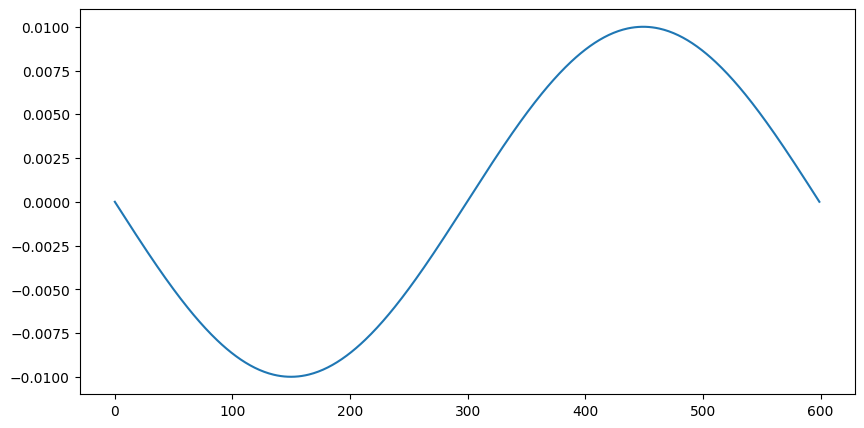

|   iter    |  target   |  input0   |  input1   |  input2   |  input3   |  input4   |  input5   |  input6   |  input7   |
-------------------------------------------------------------------------------------------------------------------------


| 95        | -0.2415   | 0.0004609 | -0.006322 | -0.006483 | -0.007029 | -0.001992 | 0.004908  | -0.003348 | 0.0001648 |
| 156       | -0.2363   | 0.00204   | -0.009669 | -0.01473  | -0.008495 | 0.003919  | 0.01193   | 0.004004  | -0.000357 |
| 193       | -0.2344   | -0.002395 | -0.008618 | -0.01209  | -0.009001 | 0.003007  | 0.01321   | 0.005494  | 2.002e-05 |
| 216       | -0.2284   | -0.003521 | -0.01124  | -0.01155  | -0.005762 | 0.002962  | 0.008317  | 0.005955  | -0.004886 |
| 329       | -0.2278   | -0.002905 | -0.01132  | -0.01237  | -0.006737 | 0.002078  | 0.007167  | 0.005641  | -0.00336  |
| 338       | -0.2278   | -0.00236  | -0.01024  | -0.01137  | -0.00546  | 0.002659  | 0.007413  | 0.005327  | -0.00243  |
| 346       | -0.2277   | -0.002303 | -0.01147  | -0.01326  | -0.007026 | 0.001655  | 0.00578   | 0.004296  | -0.003365 |
| 360       | -0.2276   | -0.002567 | -0.01102  | -0.01225  | -0.006363 | 0.002088  | 0.006878  | 0.004355  | -0.003885 |
| 384       | -0.2274   

In [7]:
assumed_angle = np.linspace(0, np.pi, 600)
angle_shift = np.cos(assumed_angle * 2 + 0.5 * np.pi) * 0.01
true_angle = angle_shift + assumed_angle

plt.figure(figsize=(10, 5))
plt.plot(angle_shift)
plt.show()

true_recon, assumed_recon, corrected_recon, corrected_angle = experiment(phantom, true_angle, assumed_angle)

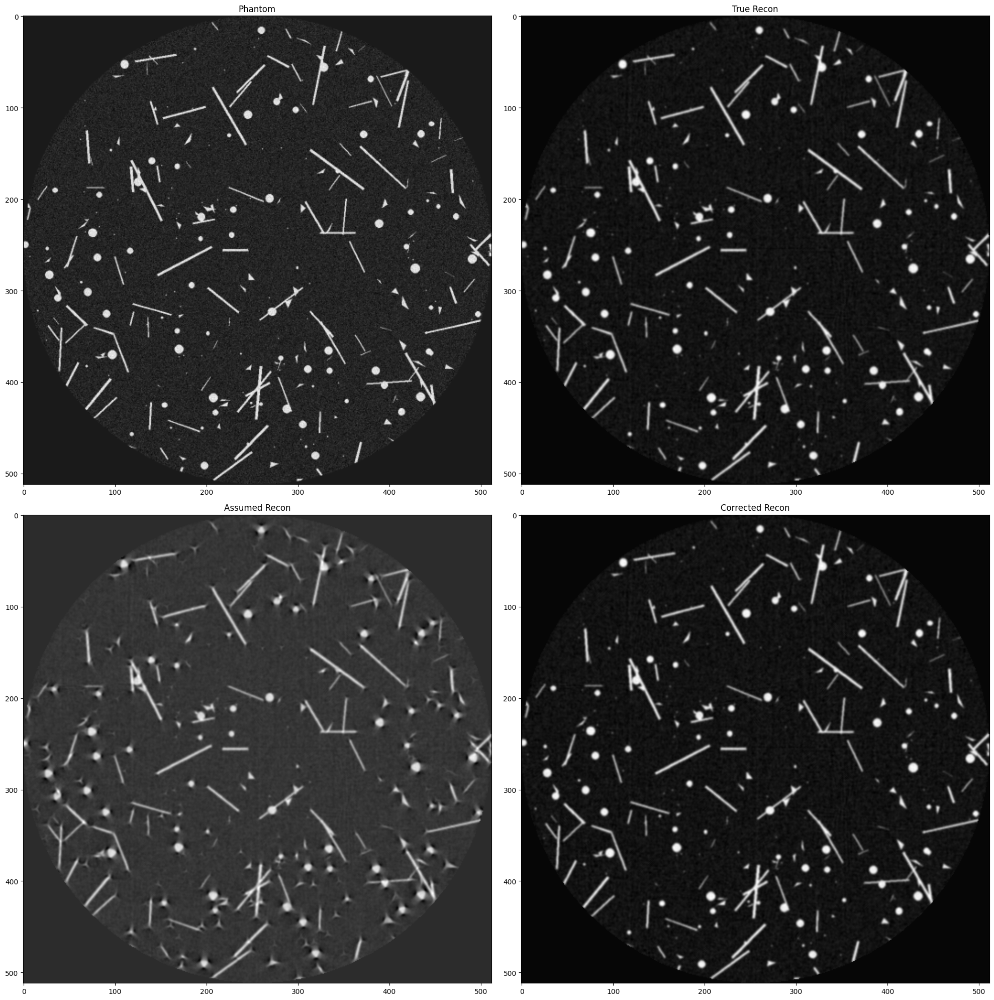

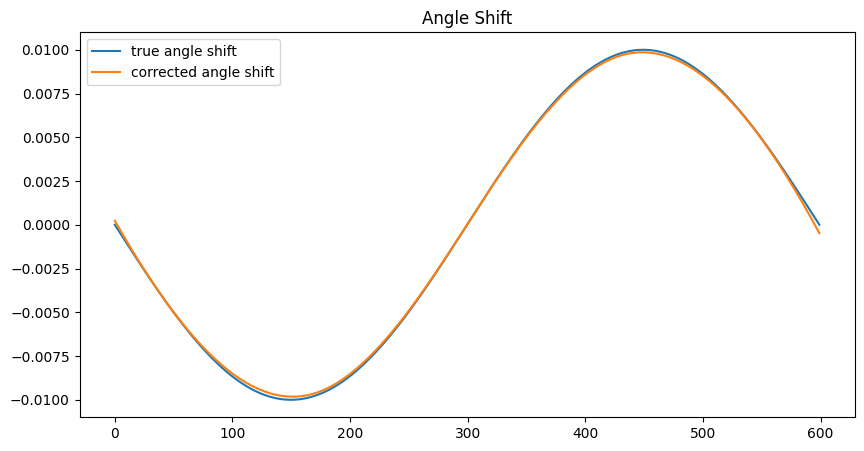

In [8]:
plot_results(phantom, true_recon, assumed_recon, corrected_recon, angle_shift, corrected_angle - assumed_angle, './notebooks/figs/cos_')

## Multiple Cos Angle Shift

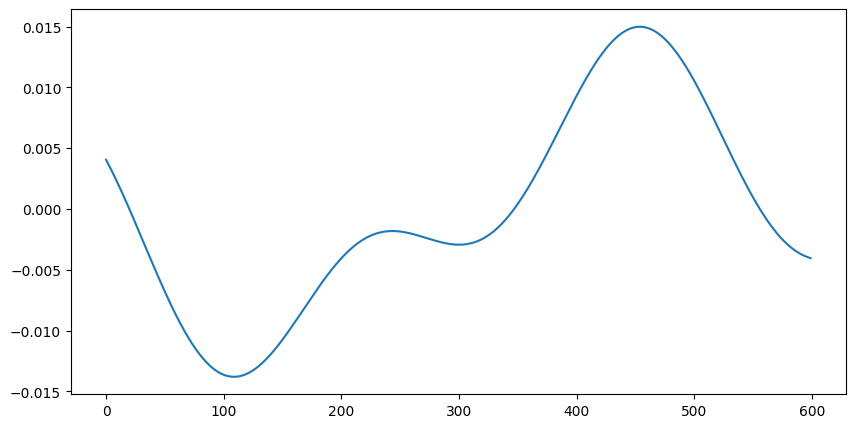

|   iter    |  target   |  input0   |  input1   |  input2   |  input3   |  input4   |  input5   |  input6   |  input7   |
-------------------------------------------------------------------------------------------------------------------------
| 52        | -0.2556   | 0.001586  | 0.0002212 | 0.0002431 | -0.00108  | -9.421e-0 | -0.00027  | 2.413e-05 | -0.000790 |
| 53        | -0.248    | 0.002648  | -0.006252 | 0.005012  | 0.0002208 | 0.002757  | 0.01214   | 0.01177   | -0.008368 |
| 56        | -0.2432   | 0.002412  | -0.01609  | -0.005113 | 0.003769  | 0.00436   | 0.01108   | 0.003137  | -0.01778  |
| 114       | -0.2418   | 0.0189    | 0.003958  | 0.01027   | 0.0129    | 0.01791   | 0.02169   | 0.01979   | 0.005149  |
| 149       | -0.2405   | 0.02517   | 0.006002  | 0.004682  | 0.00656   | 0.01281   | 0.03007   | 0.028     | 0.007026  |
| 179       | -0.2343   | 0.01418   | -0.001034 | 0.002334  | 0.01108   | 0.01279   | 0.0276    | 0.02365   | 0.001738  |
| 262       | -0.2339   

In [5]:
assumed_angle = np.linspace(0, np.pi, 600)
angle_shift = np.cos(assumed_angle * 2 + 0.5 * np.pi) * 0.01 + np.cos(assumed_angle * 5 + 0.2 * np.pi) * 0.005
true_angle = angle_shift + assumed_angle

plt.figure(figsize=(10, 5))
plt.plot(angle_shift)
plt.show()

true_recon, assumed_recon, corrected_recon, corrected_angle = experiment(phantom, true_angle, assumed_angle)

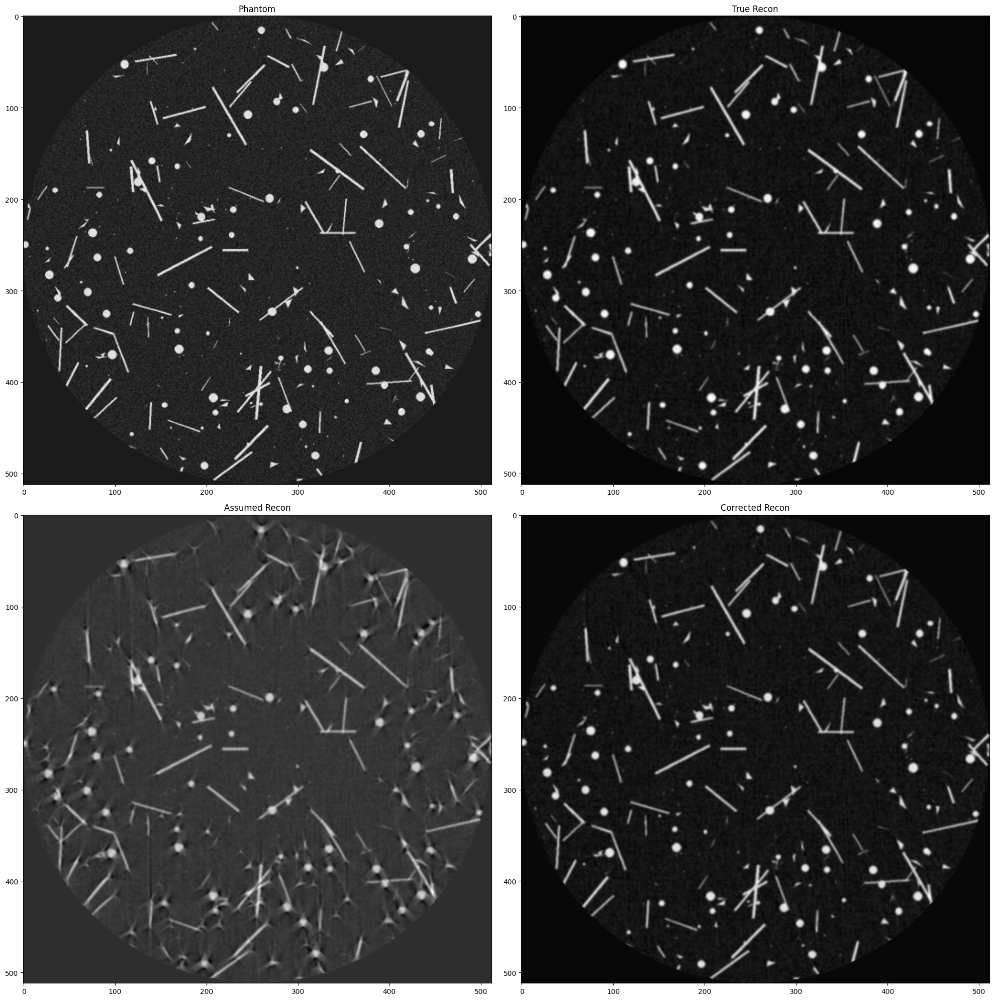

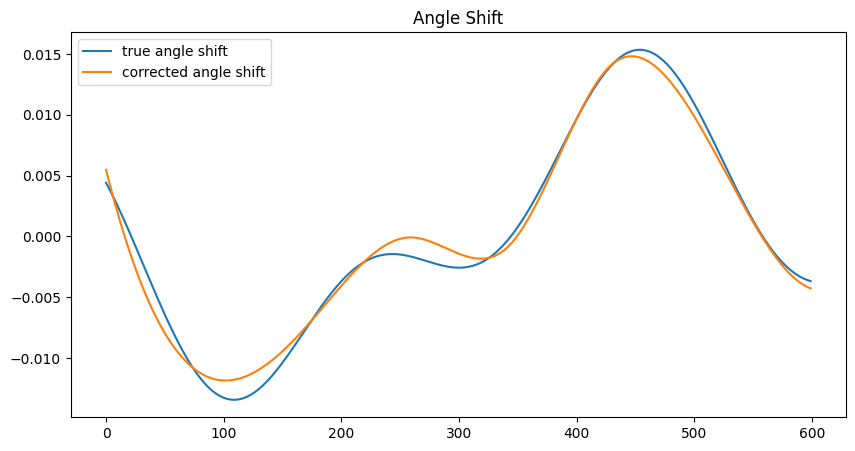

In [7]:
plot_results(phantom, true_recon, assumed_recon, corrected_recon, angle_shift, corrected_angle - assumed_angle, './notebooks/figs/multi_cos_')